# Optional Lab: Gradient Descent for Linear Regression

<figure>
    <center> <img src="./images/C1_W1_L4_S1_Lecture_GD.png"  style="width:800px;height:200px;" ></center>
</figure>

## Goals
In this lab, you will:
- automate the process of optimizing $w$ and $b$ using gradient descent.

## Tools
In this lab, we will make use of: 
- NumPy, a popular library for scientific computing
- Matplotlib, a popular library for plotting data
- plotting routines in the lab_utils.py file in the local directory

In [2]:
!pip install nbconvert

In [5]:
import math, copy
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('./deeplearning.mplstyle')
from lab_utils_uni import plt_house_x, plt_contour_wgrad, plt_divergence, plt_gradients
from excltool import *
import pandas as pd
import seaborn as sns
%matplotlib inline

<a name="toc_40291_2"></a>
# Problem Statement

Let's use the same two data points as before - a house with 1000 square feet sold for \\$300,000 and a house with 2000 square feet sold for \\$500,000.

| Size (1000 sqft)     | Price (1000s of dollars) |
| ----------------| ------------------------ |
| 1               | 300                      |
| 2               | 500                      |


In [6]:
HouseDF = pd.read_excel('DATA RUMAH.xlsx')

In [7]:
HouseDF['LT'].describe()

count    1003.000000
mean      233.582253
std       169.110158
min        25.000000
25%       130.000000
50%       162.000000
75%       289.000000
max      1069.000000
Name: LT, dtype: float64

In [8]:
# Load our data set
x_train = get_x_train()#features
y_train = get_y_train()  #target value

Scalarization test:

<a name="toc_40291_2.0.1"></a>
### Compute_Cost
This was developed in the last lab. We'll need it again here.

In [9]:
#Function to calculate the cost
def compute_cost(x, y, w, b):
   
    m = x.shape[0] 
    cost = np.float64(0)
    
    for i in range(m):
        f_wb = (w * x[i] + b)
        cost = (cost + (f_wb - y[i])**2)
    total_cost = np.float64(1 / (2 * m) * cost)

    return total_cost

<a name="toc_40291_2.1"></a>
## Gradient descent summary
So far in this course, you have developed a linear model that predicts $f_{w,b}(x^{(i)})$:
$$f_{w,b}(x^{(i)}) = wx^{(i)} + b \tag{1}$$
In linear regression, you utilize input training data to fit the parameters $w$,$b$ by minimizing a measure of the error between our predictions $f_{w,b}(x^{(i)})$ and the actual data $y^{(i)}$. The measure is called the $cost$, $J(w,b)$. In training you measure the cost over all of our training samples $x^{(i)},y^{(i)}$
$$J(w,b) = \frac{1}{2m} \sum\limits_{i = 0}^{m-1} (f_{w,b}(x^{(i)}) - y^{(i)})^2\tag{2}$$ 


In lecture, *gradient descent* was described as:

$$\begin{align*} \text{repeat}&\text{ until convergence:} \; \lbrace \newline
\;  w &= w -  \alpha \frac{\partial J(w,b)}{\partial w} \tag{3}  \; \newline 
 b &= b -  \alpha \frac{\partial J(w,b)}{\partial b}  \newline \rbrace
\end{align*}$$
where, parameters $w$, $b$ are updated simultaneously.  
The gradient is defined as:
$$
\begin{align}
\frac{\partial J(w,b)}{\partial w}  &= \frac{1}{m} \sum\limits_{i = 0}^{m-1} (f_{w,b}(x^{(i)}) - y^{(i)})x^{(i)} \tag{4}\\
  \frac{\partial J(w,b)}{\partial b}  &= \frac{1}{m} \sum\limits_{i = 0}^{m-1} (f_{w,b}(x^{(i)}) - y^{(i)}) \tag{5}\\
\end{align}
$$

Here *simultaniously* means that you calculate the partial derivatives for all the parameters before updating any of the parameters.

<a name="toc_40291_2.2"></a>
## Implement Gradient Descent
You will implement gradient descent algorithm for one feature. You will need three functions. 
- `compute_gradient` implementing equation (4) and (5) above
- `compute_cost` implementing equation (2) above (code from previous lab)
- `gradient_descent`, utilizing compute_gradient and compute_cost

Conventions:
- The naming of python variables containing partial derivatives follows this pattern,$\frac{\partial J(w,b)}{\partial b}$  will be `dj_db`.
- w.r.t is With Respect To, as in partial derivative of $J(wb)$ With Respect To $b$.


<a name="toc_40291_2.3"></a>
### compute_gradient
<a name='ex-01'></a>
`compute_gradient`  implements (4) and (5) above and returns $\frac{\partial J(w,b)}{\partial w}$,$\frac{\partial J(w,b)}{\partial b}$. The embedded comments describe the operations.

In [10]:
def compute_gradient(x, y, w, b): 
    """
    Computes the gradient for linear regression 
    Args:
      x (ndarray (m,)): Data, m examples 
      y (ndarray (m,)): target values
      w,b (scalar)    : model parameters  
    Returns
      dj_dw (scalar): The gradient of the cost w.r.t. the parameters w
      dj_db (scalar): The gradient of the cost w.r.t. the parameter b     
     """
    
    # Number of training examples
    m = x.shape[0]    
    dj_dw = np.float64(0)
    dj_db = np.float64(0)
    
    for i in range(m):  
        f_wb = (w * x[i] + b) 
        dj_dw_i = ((f_wb - y[i]) * x[i])
        dj_db_i = (f_wb - y[i]) 
        dj_db += (dj_db_i)
        dj_dw += (dj_dw_i) 
    dj_dw = dj_dw / m 
    dj_db = dj_db / m 
        
    return dj_dw, dj_db

<br/>

<a name="toc_40291_2.5"></a>
###  Gradient Descent
Now that gradients can be computed,  gradient descent, described in equation (3) above can be implemented below in `gradient_descent`. The details of the implementation are described in the comments. Below, you will utilize this function to find optimal values of $w$ and $b$ on the training data.

In [11]:
def gradient_descent(x, y, w_in, b_in, alpha, num_iters, cost_function, gradient_function):
    """
    Performs gradient descent to fit w,b. Updates w,b by taking 
    num_iters gradient steps with learning rate alpha
    
    Args:
        x (ndarray (m,))  : Data, m examples 
        y (ndarray (m,))  : target values
        w_in,b_in (scalar): initial values of model parameters  
        alpha (float):     Learning rate
        num_iters (int):   number of iterations to run gradient descent
        cost_function:     function to call to produce cost
        gradient_function: function to call to produce gradient
      
    Returns:
        w (scalar): Updated value of parameter after running gradient descent
        b (scalar): Updated value of parameter after running gradient descent
        J_history (List): History of cost values
        p_history (list): History of parameters [w,b] 
    """
    
    # Specify data type as np.float64 for w, b
    w = np.float64(w_in)
    b = np.float64(b_in)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_history = []
    p_history = []
    
    for i in range(num_iters):
        # Calculate the gradient and update the parameters using gradient_function
        dj_dw, dj_db = gradient_function(x, y, w , b)     

        # Update Parameters using equation (3) above
        b = b - alpha * dj_db                            
        w = np.float64(w - alpha * dj_dw)                            

        # Save cost J at each iteration
        J_history.append(cost_function(x, y, w, b))
        p_history.append([w, b])

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/80) == 0:
            print(f"Iteration {i:4}: Cost {J_history[-1]:0.2e} ",
                  f"dj_dw: {dj_dw: 0.3e}, dj_db: {dj_db: 0.3e}  ",
                  f"w: {w: 0.3e}, b: {b: 0.5e}")
 
    return w, b, J_history, p_history  # Return w and J,w history for graphing


In [12]:
# Initialize parameters with np.float64 data type
w_init = np.float64(0)
b_init = np.float64(0)

# Some gradient descent settings
iterations = 80000
tmp_alpha = np.float64(1.0e-9)

# Run gradient descent
w_final, b_final, J_hist, p_hist = (gradient_descent(x_train, y_train, w_init, b_init, tmp_alpha,
                                                    iterations, compute_cost, compute_gradient))

# Print the result
print(f"(w, b) found by gradient descent: ({w_final}, {b_final})")

Iteration    0: Cost 5.04e+19  dj_dw: -2.681e+12, dj_db: -7.430e+09   w:  2.681e+03, b:  7.43035e+00
Iteration 1000: Cost 4.38e+19  dj_dw: -2.468e+12, dj_db: -6.831e+09   w:  2.575e+06, b:  7.13360e+03
Iteration 2000: Cost 3.81e+19  dj_dw: -2.272e+12, dj_db: -6.279e+09   w:  4.943e+06, b:  1.36844e+04
Iteration 3000: Cost 3.34e+19  dj_dw: -2.091e+12, dj_db: -5.771e+09   w:  7.124e+06, b:  1.97056e+04
Iteration 4000: Cost 2.94e+19  dj_dw: -1.925e+12, dj_db: -5.303e+09   w:  9.131e+06, b:  2.52392e+04
Iteration 5000: Cost 2.59e+19  dj_dw: -1.772e+12, dj_db: -4.873e+09   w:  1.098e+07, b:  3.03240e+04
Iteration 6000: Cost 2.31e+19  dj_dw: -1.632e+12, dj_db: -4.476e+09   w:  1.268e+07, b:  3.49956e+04
Iteration 7000: Cost 2.06e+19  dj_dw: -1.502e+12, dj_db: -4.111e+09   w:  1.424e+07, b:  3.92867e+04
Iteration 8000: Cost 1.85e+19  dj_dw: -1.383e+12, dj_db: -3.776e+09   w:  1.569e+07, b:  4.32277e+04
Iteration 9000: Cost 1.68e+19  dj_dw: -1.273e+12, dj_db: -3.466e+09   w:  1.701e+07, b:  4.

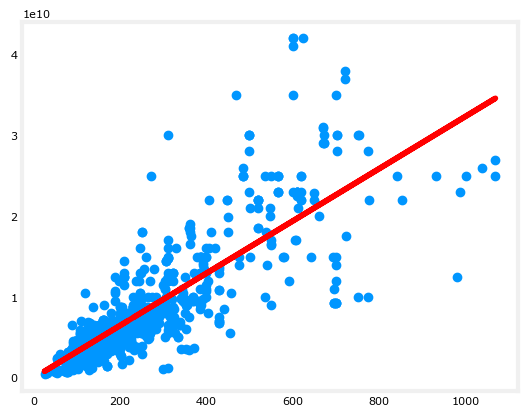

In [9]:
plt.plot(x_train, y_train,'o')
plt.plot(x_train, w_final*x_train+b_final, 'r')
plt.show()

In [10]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create a subplot
fig = make_subplots(rows=1, cols=1)

# Add the scatter plot
scatter_trace = go.Scatter(x=x_train, y=y_train, mode='markers', name='Data Points')
fig.add_trace(scatter_trace)

# Add the regression line
line_trace = go.Scatter(x=x_train, y=w_final * x_train + b_final, mode='lines', name='Regression Line', line=dict(color='red'))
fig.add_trace(line_trace)

# Customize layout
fig.update_layout(title="Interactive Scatter Plot", xaxis_title="X", yaxis_title="Y")

# Show the plot
fig.show()

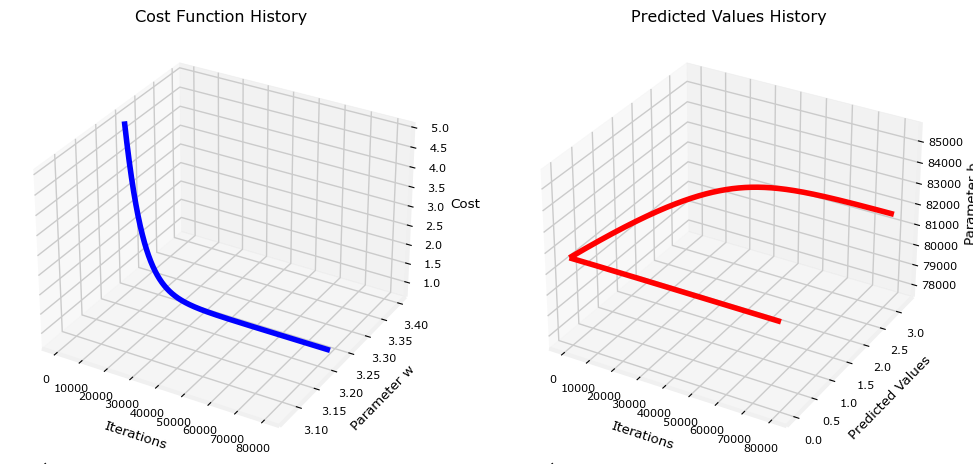

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Create an interactive 3D plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

# Plot the cost function history in 3D
ax.plot(np.arange(iterations), np.full(iterations, w_final), J_hist, 'b-', label='Cost Function')
ax.set_xlabel('Iterations')
ax.set_ylabel('Parameter w')
ax.set_zlabel('Cost')
ax.set_title('Cost Function History')

# Plot the predicted values history in 3D
ax2.plot(np.arange(len(p_hist)), p_hist, np.full(len(p_hist), b_final), 'r-', label='Predicted Values')
ax2.set_xlabel('Iterations')
ax2.set_ylabel('Predicted Values')
ax2.set_zlabel('Parameter b')
ax2.set_title('Predicted Values History')

plt.show()

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Get minimum and maximum values of w and b from the p_history
p_hist = np.array(p_hist)
w_min, w_max = np.min(p_hist[:, 0]), np.max(p_hist[:, 0])
b_min, b_max = np.min(p_hist[:, 1]), np.max(p_hist[:, 1])

# Create a meshgrid for w and b values
w_range = np.linspace(w_min - 2, w_max + 2, 100)
b_range = np.linspace(b_min - 2, b_max + 2, 100)
W, B = np.meshgrid(w_range, b_range)

# Compute the cost function for each combination of w and b
Z = compute_cost(x_train, y_train, W, B)

# Create an interactive 3D surface plot with heat
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Cost Function Surface with Heat", "Predicted Values History"),
                    specs=[[{'type': 'surface'}]*2])

# Plot the cost function surface with heat
fig.add_trace(go.Surface(x=w_range, y=b_range, z=Z, colorscale='Viridis', showscale=True),
              row=1, col=1)

# Plot the predicted values history
fig.add_trace(go.Scatter3d(x=np.arange(len(p_hist)), y=p_hist[:, 0], z=p_hist[:, 1],
                           mode='lines', line=dict(color='red'), name='Predicted Values'),
              row=1, col=2)

# Update the layout for the first subplot
fig.update_layout(scene=dict(
    xaxis_title='Parameter w',
    yaxis_title='Parameter b',
    zaxis_title='Cost',
), scene2=dict(
    xaxis_title='Iterations',
    yaxis_title='Parameter w',
    zaxis_title='Parameter b',
))

# Show the interactive 3D plot
fig.show()

### Cost versus iterations of gradient descent 
A plot of cost versus iterations is a useful measure of progress in gradient descent. Cost should always decrease in successful runs. The change in cost is so rapid initially, it is useful to plot the initial decent on a different scale than the final descent. In the plots below, note the scale of cost on the axes and the iteration step.

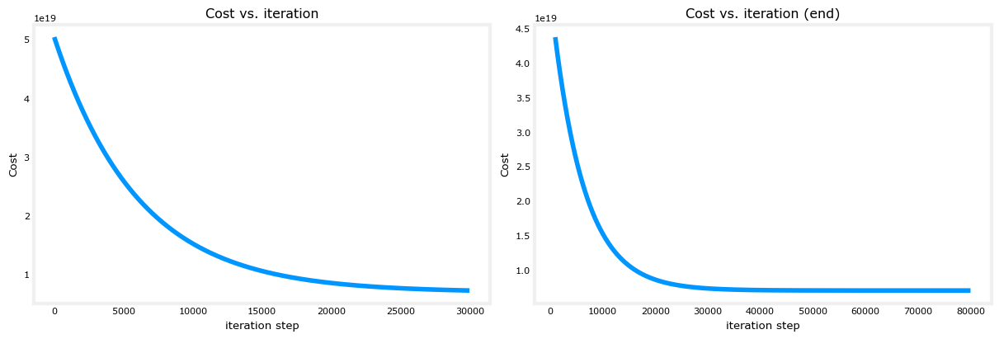

In [13]:
# plot cost versus iteration  
fig, (ax1, ax2) = plt.subplots(1, 2, constrained_layout=True, figsize=(12,4))
ax1.plot(J_hist[:30000])
ax2.plot(1000 + np.arange(len(J_hist[1000:])), J_hist[1000:])
ax1.set_title("Cost vs. iteration");  ax2.set_title("Cost vs. iteration (end)")
ax1.set_ylabel('Cost')            ;  ax2.set_ylabel('Cost') 
ax1.set_xlabel('iteration step')  ;  ax2.set_xlabel('iteration step') 
plt.show()

### Predictions
Now that you have discovered the optimal values for the parameters $w$ and $b$, you can now use the model to predict housing values based on our learned parameters. As expected, the predicted values are nearly the same as the training values for the same housing. Further, the value not in the prediction is in line with the expected value.

In [12]:
print(f"1 meter house prediction {w_final*1 + b_final:0.0f} Ribu Rupiah")
print(f"2 meter house prediction {w_final*2 + b_final:0.1f} Ribu Rupiah")
print(f"25 meter house prediction {w_final*25 + b_final:0.1f} Thousand dollars")

1 meter house prediction 32433359 Ribu Rupiah
2 meter house prediction 64785069.2 Ribu Rupiah
25 meter house prediction 808874412.0 Thousand dollars


In [24]:
def prediction(input):
    prediction = w_final * input + b_final
    return prediction

userinput = int(input())
print(f"Hasil Prediksi Harga Dari Rumah Dengan Luas Tanah {userinput:0.0f}m Adalah : {prediction(userinput):0.0f}")

1
Hasil Prediksi Harga Dari Rumah Dengan Luas Tanah 1m Adalah : 32433359


In [13]:
print(w_final)
print(b_final)

32351710.556686126
81648.08324237925
